In [1]:
# Core scverse libraries
import scanpy as sc
import anndata as ad
import pandas as pd
# Data retrieval
import pooch

In [197]:
sc.settings.set_figure_params(dpi=200, facecolor="white")

In [7]:
EXAMPLE_DATA = pooch.create(
    path=pooch.os_cache("scverse_tutorials"),
    base_url="doi:10.6084/m9.figshare.22716739.v1/",
)
EXAMPLE_DATA.load_registry_from_doi()

In [15]:
dir(EXAMPLE_DATA)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_assert_file_in_registry',
 'abspath',
 'allow_updates',
 'base_url',
 'fetch',
 'get_url',
 'is_available',
 'load_registry',
 'load_registry_from_doi',
 'path',
 'registry',
 'registry_files',
 'retry_if_failed',
 'urls']

In [17]:
samples = {
    "s1d1": "s1d1_filtered_feature_bc_matrix.h5",
    "s1d3": "s1d3_filtered_feature_bc_matrix.h5",
}
adatas = {}

for sample_id, filename in samples.items():
    path = EXAMPLE_DATA.fetch(filename)
    sample_adata = sc.read_10x_h5(path)
    sample_adata.var_names_make_unique()
    adatas[sample_id] = sample_adata

adata = ad.concat(adatas, label="sample")
adata.obs_names_make_unique()
print(adata.obs["sample"].value_counts())
adata

/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


sample
s1d1    8785
s1d3    8340
Name: count, dtype: int64


/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 17125 × 36601
    obs: 'sample'

In [21]:
adatas

{'s1d1': AnnData object with n_obs × n_vars = 8785 × 36601
     var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence',
 's1d3': AnnData object with n_obs × n_vars = 8340 × 36601
     var: 'gene_ids', 'feature_types', 'genome', 'pattern', 'read', 'sequence'}

In [27]:
ad.concat(adatas, label="samphugiuygble")

/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 17125 × 36601
    obs: 'samphugiuygble'

In [55]:
sum(adata.obs_names.unique() == adata.obs_names)

17125

In [85]:
adata.obs['sample','s1d1']

KeyError: ('sample', 's1d1')

In [87]:
adata.var

""
MIR1302-2HG
FAM138A
OR4F5
AL627309.1
AL627309.3
...
AC141272.1
AC023491.2
AC007325.1
AC007325.4


In [93]:
sum(adata.var_names.str.startswith(("RPS", "RPL")))

103

In [95]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [99]:
sc.pp

<module 'scanpy.preprocessing' from '/home/mohammad/anaconda3/lib/python3.12/site-packages/scanpy/preprocessing/__init__.py'>

In [101]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

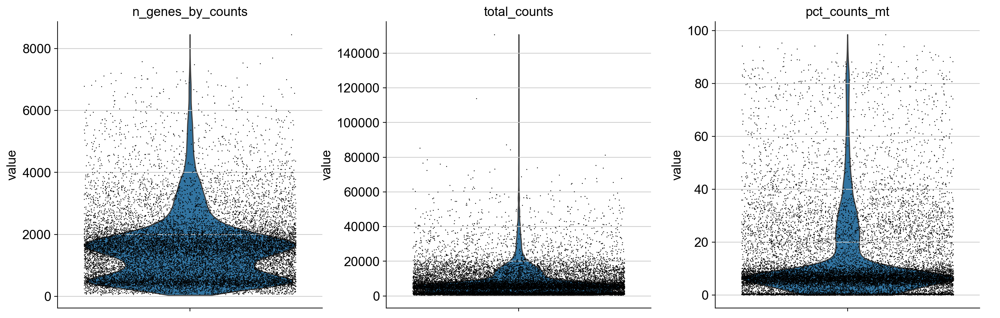

In [121]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)


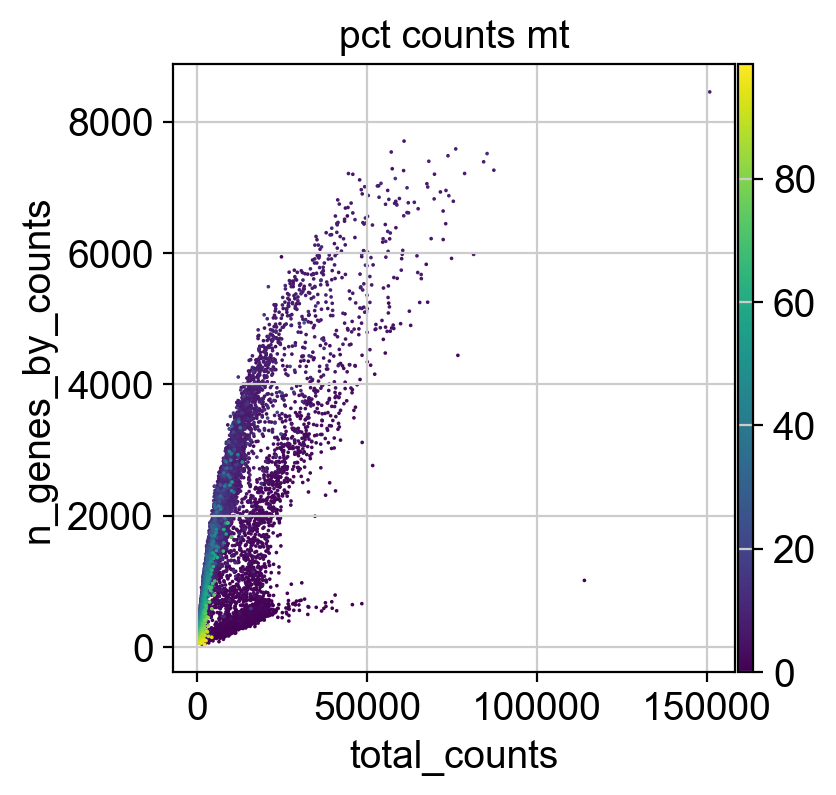

In [119]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [133]:
adata2= sc.pp.filter_cells(adata, min_genes=100)
adata2 = sc.pp.filter_genes(adata, min_cells=3)
type(adata2)

NoneType

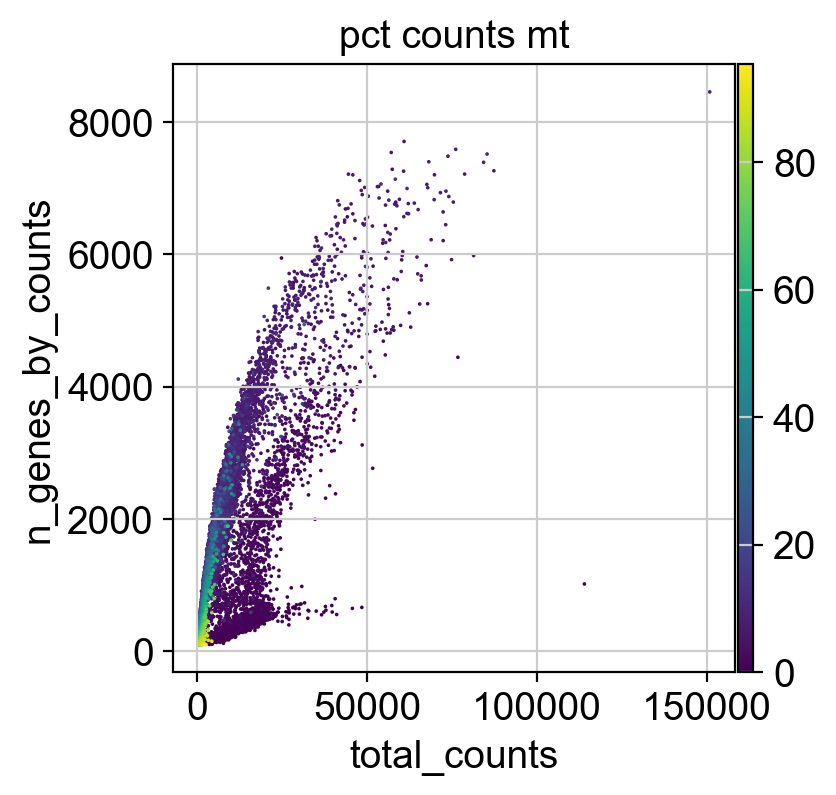

In [125]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [137]:
adata2 = sc.pp.scrublet(adata, batch_key="sample")

In [139]:
adata.obs.doublet_score

AAACCCAAGGATGGCT-1    0.033229
AAACCCAAGGCCTAGA-1    0.256724
AAACCCACAAGAGGCT-1    0.034410
AAACCCACATTCTCTA-1    0.013679
AAACCCAGTGCATACT-1    0.039632
                        ...   
TTTGGTTGTCTCACAA-1    0.093361
TTTGGTTTCCGTCCTA-1    0.053287
TTTGTTGCAGACAATA-1    0.070826
TTTGTTGCATGTTACG-1    0.044172
TTTGTTGTCGCGCTGA-1    0.109027
Name: doublet_score, Length: 11182, dtype: float64

In [143]:
adata.obs.predicted_doublet.value_counts()

predicted_doublet
False    11179
True         3
Name: count, dtype: int64

In [145]:
adata.layers["counts"]

KeyError: 'counts'

In [151]:
adata.X.shape

(11182, 16483)

In [153]:
# Saving count data
adata.layers["counts"] = adata.X.copy()

In [155]:
adata.layers["counts"]

<11182x16483 sparse matrix of type '<class 'numpy.float32'>'
	with 23271015 stored elements in Compressed Sparse Row format>

In [157]:
# Normalizing to median total counts
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

In [159]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key="sample")

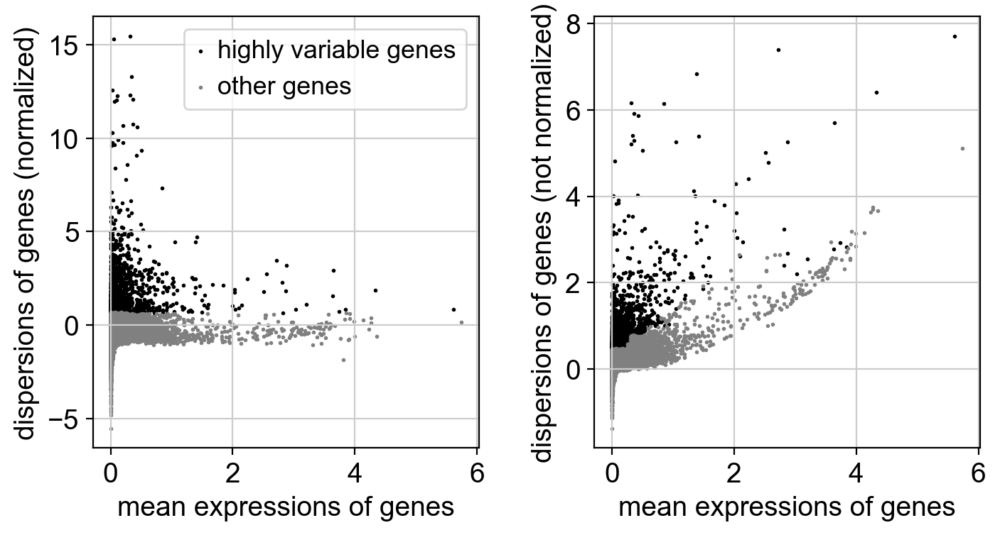

In [161]:
sc.pl.highly_variable_genes(adata)

In [163]:
sc.tl.pca(adata)

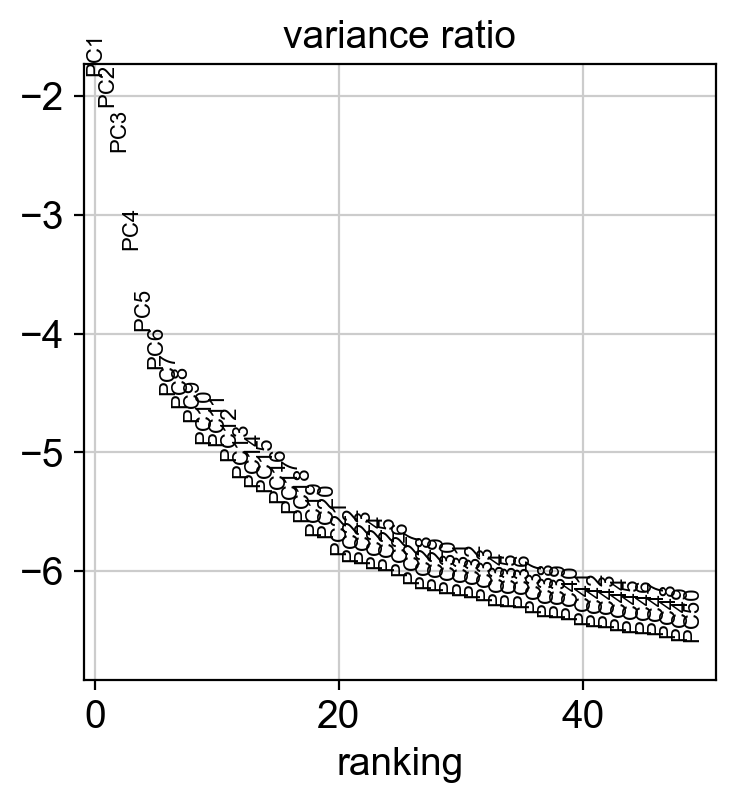

In [165]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

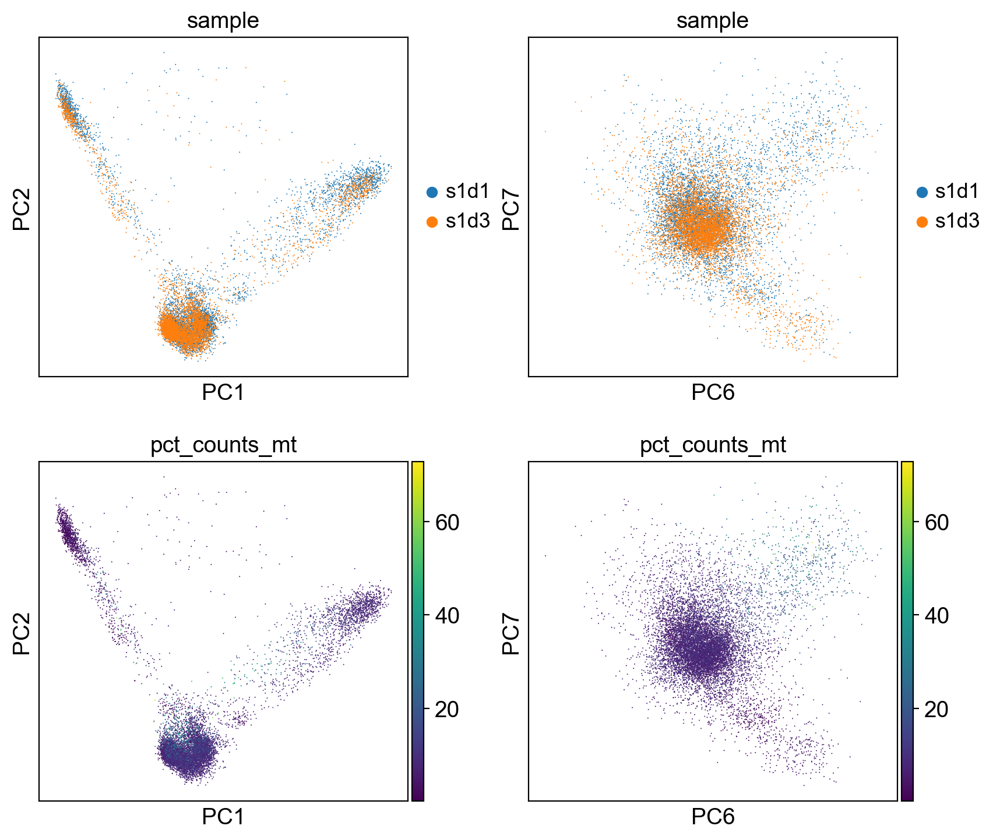

In [185]:
sc.pl.pca(
    adata,
    color=["sample", "sample", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (5, 6), (0, 1), (5, 6)],
    ncols=2,
    size=2,
)

In [187]:
sc.pp.neighbors(adata)

2024-10-08 16:40:14.748976: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-08 16:40:14.808200: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-08 16:40:14.823976: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-08 16:40:14.926415: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-08 16:40:15.853008: W tensorflow/compiler/tf2

In [189]:
sc.tl.umap(adata)

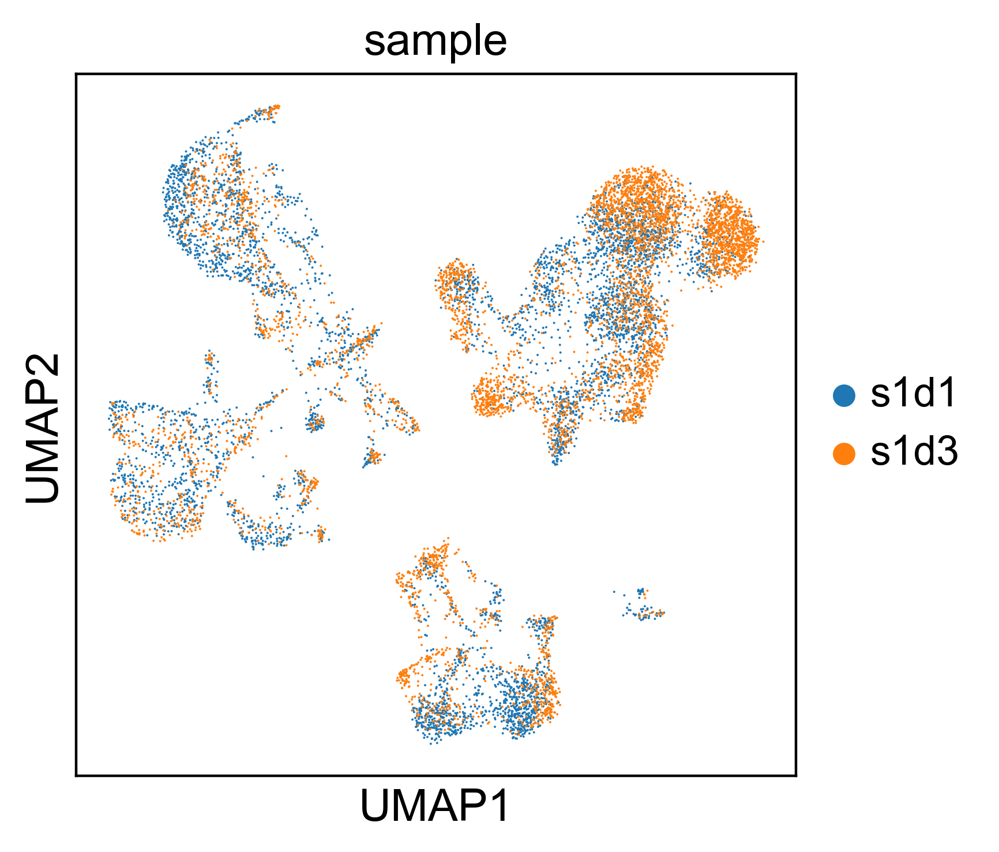

In [199]:
sc.pl.umap(
    adata,
    color="sample",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

In [203]:
# Using the igraph implementation and a fixed number of iterations can be significantly faster, especially for larger datasets
sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

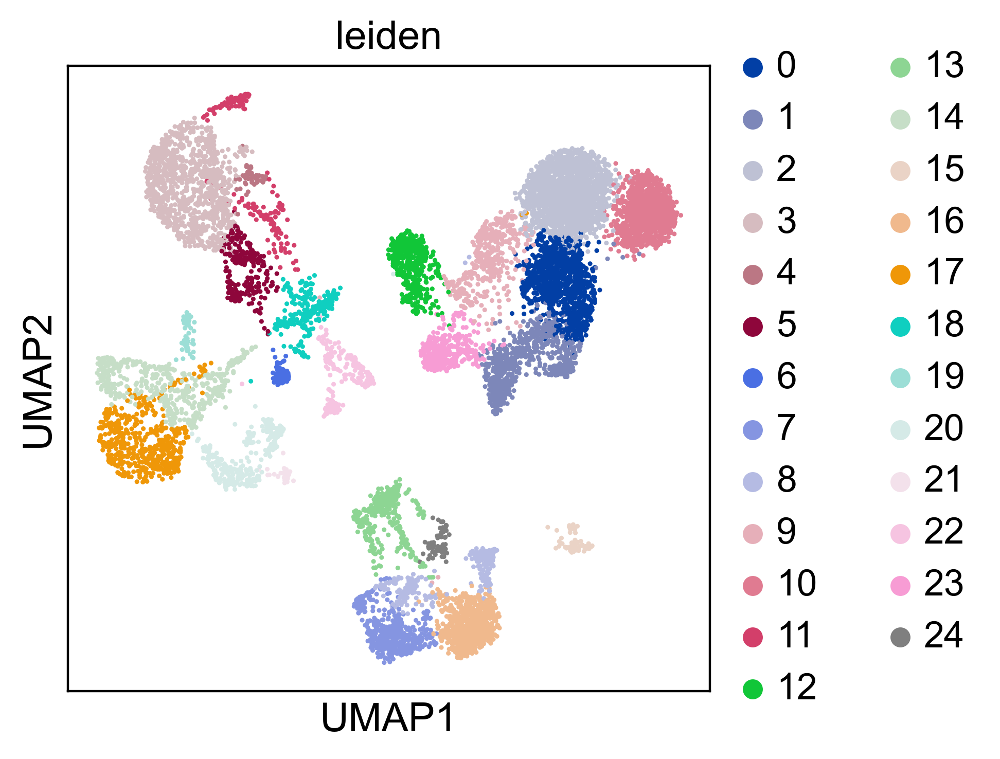

In [205]:
sc.pl.umap(adata, color=["leiden"])

KeyError: 'Could not find key aa in .var_names or .obs.columns.'

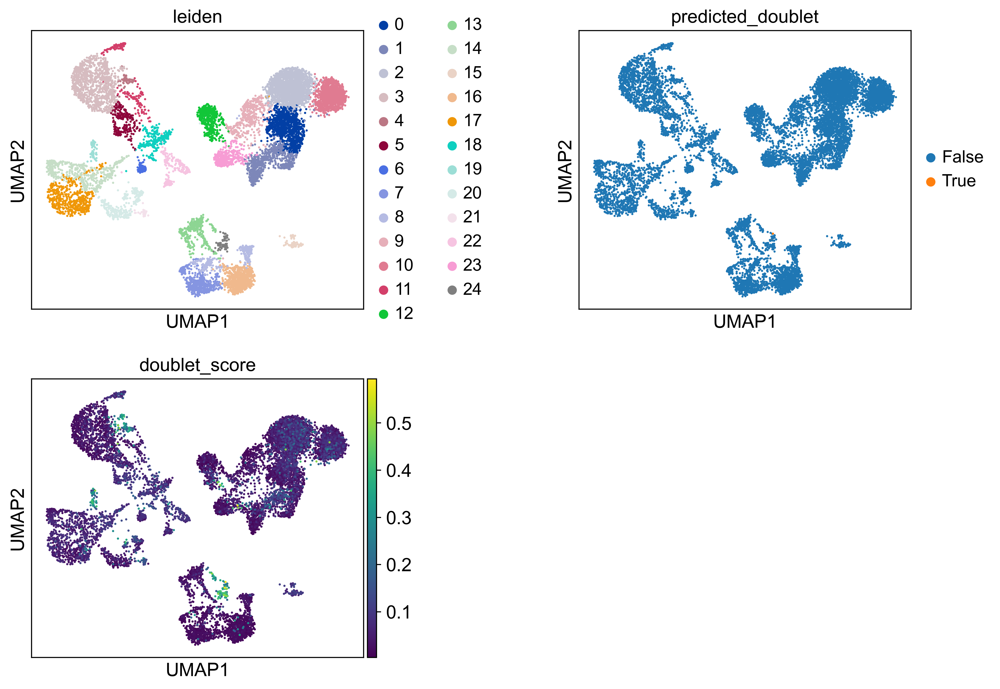

In [219]:
sc.pl.umap(
    adata,
    color=["leiden", "predicted_doublet", "doublet_score", "aa"],
    # increase horizontal space between panels
    wspace=0.5,
    ncols= 2,
)

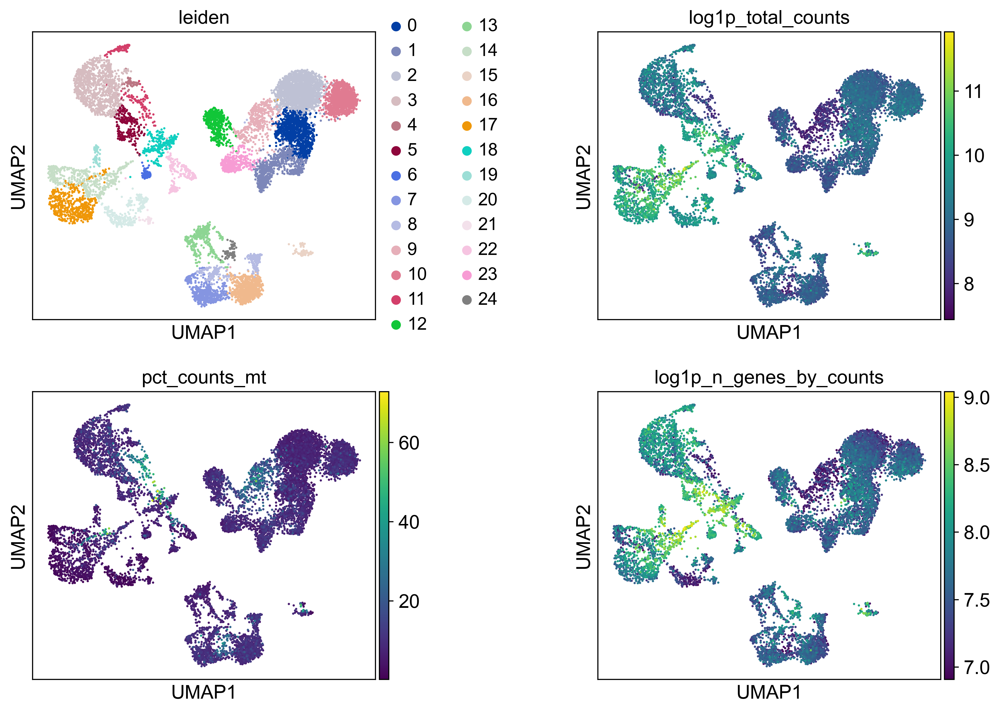

In [213]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

In [225]:
adata.obs.unique()

AttributeError: 'DataFrame' object has no attribute 'unique'

In [231]:
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

In [232]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    "Proerythroblast": ["CDK6", "SYNGR1", "HBM", "GYPA"],
    "NK": ["GNLY", "NKG7", "CD247", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
    "B cells": [
        "MS4A1",
        "ITGB1",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
    ],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    # Note PAX5 is a negative marker
    "Plasmablast": ["XBP1", "PRDM1", "PAX5"],
    "CD4+ T": ["CD4", "IL7R", "TRBC2"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
}

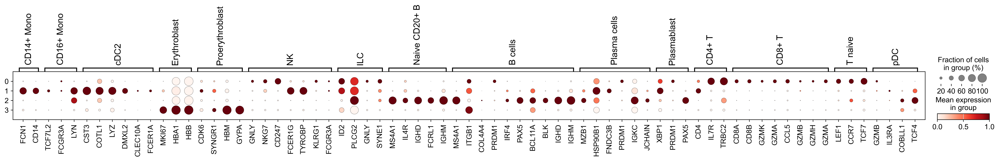

In [235]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_0.02", standard_scale="var")

In [237]:
adata.obs["cell_type_lvl1"] = adata.obs["leiden_res_0.02"].map(
    {
        "0": "Lymphocytes",
        "1": "Monocytes",
        "2": "Erythroid",
        "3": "B Cells",
    }
)

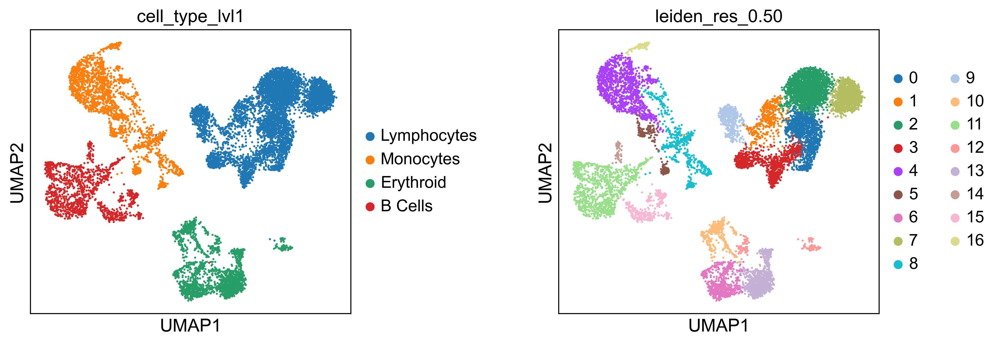

In [249]:
sc.pl.umap(
    adata,
    color=["cell_type_lvl1", "leiden_res_0.50"],
    wspace=0.5,
)

In [245]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res_0.50", method="wilcoxon")

In [253]:
sc.get.rank_genes_groups_df(adata, group="7").head(50)

,names,scores,logfoldchanges,pvals,pvals_adj
0,CD8B,48.421097,4.670846,0.000000e+00,0.000000e+00
1,RPS12,40.649853,1.367696,0.000000e+00,0.000000e+00
2,RPS6,39.780186,1.433607,0.000000e+00,0.000000e+00
3,RPS14,39.709908,1.283243,0.000000e+00,0.000000e+00
4,RPL34,39.556526,1.331629,0.000000e+00,0.000000e+00
5,RPS3A,39.336727,1.261130,0.000000e+00,0.000000e+00
6,RPS28,39.330921,1.158625,0.000000e+00,0.000000e+00
7,RPL13,39.219269,1.248948,0.000000e+00,0.000000e+00
8,RPL32,39.188866,1.302486,0.000000e+00,0.000000e+00
9,RPS25,38.469543,1.273223,0.000000e+00,0.000000e+00


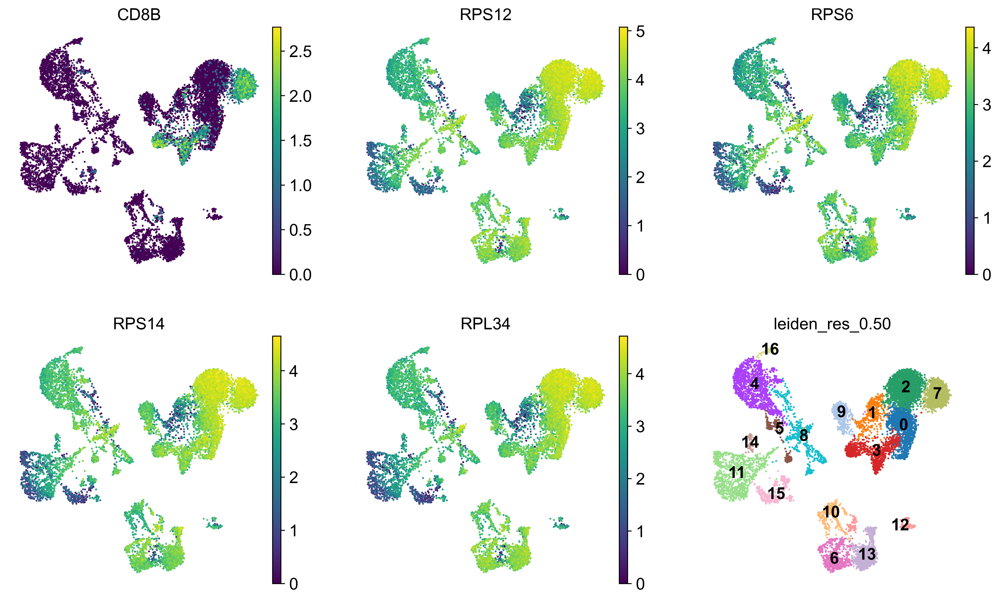

In [255]:
dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="7").head(5)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, "leiden_res_0.50"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

In [1]:
import scanpy as sc
import pandas as pd

In [7]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

-----
anndata     0.10.9
scanpy      1.10.3
-----
PIL                         10.3.0
anyio                       NA
arrow                       1.2.3
asttokens                   NA
astunparse                  1.6.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.11.0
bottleneck                  1.3.7
brotli                      1.0.9
certifi                     2024.08.30
cffi                        1.16.0
chardet                     4.0.0
charset_normalizer          2.0.4
cloudpickle                 2.2.1
colorama                    0.4.6
comm                        0.2.1
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.12.2
dask                        2024.5.0
dateutil                    2.9.0.post0
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
dill                        0.3.8
executing                   0.8.3
fastjsonschema      

In [25]:
# this is an earlier version of the dataset from the pbmc3k tutorial
adata_ref = sc.datasets.pbmc3k_processed()


  0%|          | 0.00/23.5M [00:00<?, ?B/s]

In [29]:
adata_ref

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'draw_graph', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_draw_graph_fr'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [19]:
adata = sc.datasets.pbmc68k_reduced()

In [26]:
adata

AnnData object with n_obs × n_vars = 700 × 765
    obs: 'bulk_labels', 'n_genes', 'percent_mito', 'n_counts', 'S_score', 'G2M_score', 'phase', 'louvain'
    var: 'n_counts', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'bulk_labels_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [31]:
var_names = adata_ref.var_names.intersection(adata.var_names)
adata_ref = adata_ref[:, var_names]
adata = adata[:, var_names]

In [33]:
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)

/home/mohammad/anaconda3/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
2024-10-08 17:28:49.453285: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-08 17:28:49.480911: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-08 17:28:49.489165: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-08 17:28:49.509799: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instruct

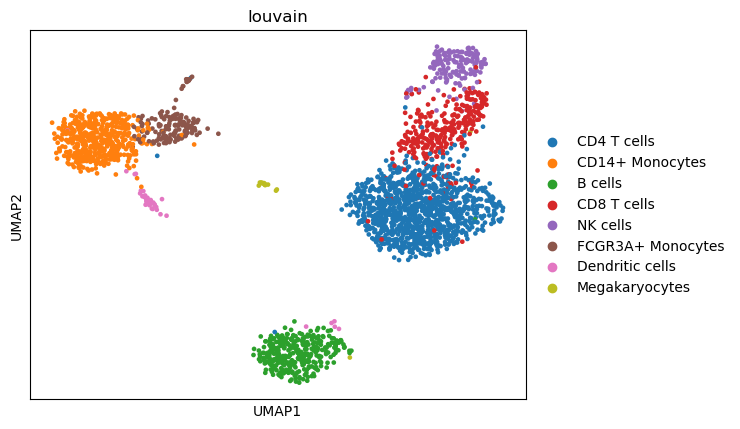

In [35]:
sc.pl.umap(adata_ref, color="louvain")

In [37]:
dir(adata_ref.obs)

['T',
 '_AXIS_LEN',
 '_AXIS_ORDERS',
 '_AXIS_TO_AXIS_NUMBER',
 '_HANDLED_TYPES',
 '__abs__',
 '__add__',
 '__and__',
 '__annotations__',
 '__array__',
 '__array_priority__',
 '__array_ufunc__',
 '__arrow_c_stream__',
 '__bool__',
 '__class__',
 '__contains__',
 '__copy__',
 '__dataframe__',
 '__dataframe_consortium_standard__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dict__',
 '__dir__',
 '__divmod__',
 '__doc__',
 '__eq__',
 '__finalize__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__imod__',
 '__imul__',
 '__init__',
 '__init_subclass__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__module__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__nonzero__',
 '__or__',
 '__pandas_priority__',
 '__pos__',
 '__pow__',
 '__r

In [39]:
adata_ref.obs.louvain

index
AAACATACAACCAC-1        CD4 T cells
AAACATTGAGCTAC-1            B cells
AAACATTGATCAGC-1        CD4 T cells
AAACCGTGCTTCCG-1    CD14+ Monocytes
AAACCGTGTATGCG-1           NK cells
                         ...       
TTTCGAACTCTCAT-1    CD14+ Monocytes
TTTCTACTGAGGCA-1            B cells
TTTCTACTTCCTCG-1            B cells
TTTGCATGAGAGGC-1            B cells
TTTGCATGCCTCAC-1        CD4 T cells
Name: louvain, Length: 2638, dtype: category
Categories (8, object): ['CD4 T cells', 'CD14+ Monocytes', 'B cells', 'CD8 T cells', 'NK cells', 'FCGR3A+ Monocytes', 'Dendritic cells', 'Megakaryocytes']

In [41]:
sc.tl.ingest(adata, adata_ref, obs="louvain")

/home/mohammad/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
<frozen _collections_abc>:982: ImplicitModificationWarning: Setting element `.obsm['rep']` of view, initializing view as actual.
<frozen _collections_abc>:982: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
<frozen _collections_abc>:982: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.


In [43]:
adata.uns

{'bulk_labels_colors': array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
        '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'], dtype='<U7'),
 'louvain': {'params': {'random_state': array([0]), 'resolution': array([1])}},
 'louvain_colors': array(['#023fa5', '#7d87b9', '#bec1d4', '#d6bcc0', '#bb7784', '#8e063b',
        '#4a6fe3', '#8595e1', '#b5bbe3', '#e6afb9', '#e07b91'], dtype='<U7'),
 'neighbors': {'params': {'method': 'umap', 'n_neighbors': array([10])}},
 'pca': {'variance': array([30.928047 , 21.182432 , 14.686322 , 11.570731 ,  9.232856 ,
          7.3497834,  4.338316 ,  3.197439 ,  3.1584399,  2.910167 ,
          2.649945 ,  2.540031 ,  2.4057367,  2.3872852,  2.2644212,
          2.2250588,  2.189688 ,  2.134691 ,  2.0775423,  2.0560663,
          2.007874 ,  1.9969993,  1.9606696,  1.9441428,  1.9129871,
          1.9063067,  1.8529838,  1.8260264,  1.7946786,  1.7489465,
          1.7449841,  1.7298484,  1.70099  ,  1.6571085,  1.6406441,
          1

In [45]:
adata_ref.uns

{'draw_graph': {'params': {'layout': 'fr', 'random_state': array([0])}},
 'louvain': {'params': {'random_state': array([0]), 'resolution': array([1])}},
 'louvain_colors': array(['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b',
        '#e377c2', '#bcbd22'], dtype='<U7'),
 'neighbors': {'connectivities_key': 'connectivities',
  'distances_key': 'distances',
  'params': {'n_neighbors': 15,
   'method': 'umap',
   'random_state': 0,
   'metric': 'euclidean'}},
 'pca': {'params': {'zero_center': True,
   'use_highly_variable': False,
   'mask_var': None},
  'variance': array([16.12825  , 12.414393 ,  8.219571 ,  2.5039477,  2.217632 ,
          1.8074672,  1.7483658,  1.7082621,  1.5930077,  1.4941097,
          1.4393383,  1.4123436,  1.3942258,  1.3888012,  1.3732697,
          1.3553213,  1.3436035,  1.3362374,  1.3325418,  1.3126001,
          1.3105342,  1.3020966,  1.2890044,  1.2763879,  1.2664694,
          1.2592152,  1.2504637,  1.245788 ,  1.2445368,  1.2399676

In [47]:
adata.uns["louvain_colors"] = adata_ref.uns["louvain_colors"]  # fix colors

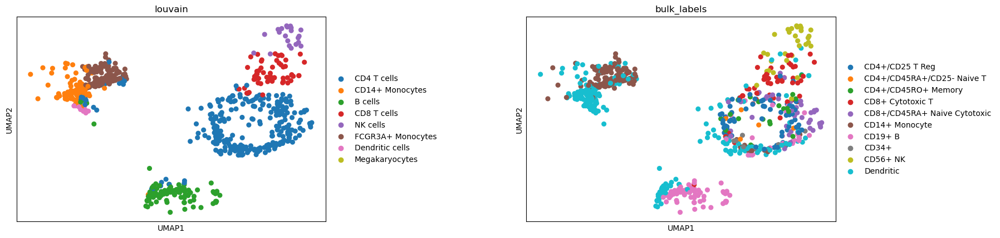

In [49]:
sc.pl.umap(adata, color=["louvain", "bulk_labels"], wspace=0.5)

In [51]:
adata_concat = adata_ref.concatenate(adata, batch_categories=["ref", "new"])

/tmp/ipykernel_13034/327172098.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_concat = adata_ref.concatenate(adata, batch_categories=["ref", "new"])


In [55]:
adata_concat.obs.louvain = adata_concat.obs.louvain.astype("category")
# fix category ordering
adata_concat.obs.louvain.cat.reorder_categories(
    adata_ref.obs.louvain.cat.categories, inplace=True
)
# fix category colors
adata_concat.uns["louvain_colors"] = adata_ref.uns["louvain_colors"]

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

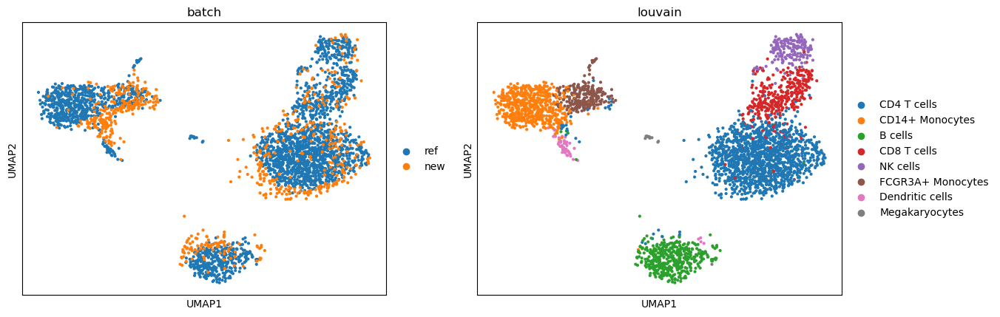

In [57]:
sc.pl.umap(adata_concat, color=["batch", "louvain"])

In [59]:
sc.tl.pca(adata_concat)

In [63]:
%%time
sc.external.pp.bbknn(adata_concat, batch_key="batch")  # running bbknn 1.3.6

CPU times: user 1.14 s, sys: 28.5 ms, total: 1.17 s
Wall time: 1.13 s


In [65]:
sc.tl.umap(adata_concat)

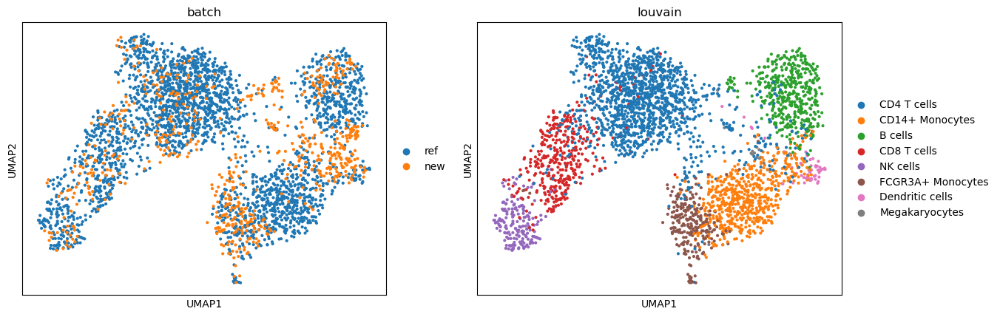

In [67]:
sc.pl.umap(adata_concat, color=["batch", "louvain"])

In [69]:
# note that this collection of batches is already intersected on the genes
adata_all = sc.read(
    "data/pancreas.h5ad",
    backup_url="https://www.dropbox.com/s/qj1jlm9w10wmt0u/pancreas.h5ad?dl=1",
)

  0%|          | 0.00/176M [00:00<?, ?B/s]

/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/compat/__init__.py:329: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/mohammad/anaconda3/lib/python3.12/site-packages/anndata/compat/__init__.py:329: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [71]:
adata_all

AnnData object with n_obs × n_vars = 14693 × 2448
    obs: 'celltype', 'sample', 'n_genes', 'batch', 'n_counts', 'louvain'
    var: 'n_cells-0', 'n_cells-1', 'n_cells-2', 'n_cells-3'
    uns: 'celltype_colors', 'louvain', 'neighbors', 'pca', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [73]:
adata_all.shape

(14693, 2448)

In [75]:
counts = adata_all.obs.celltype.value_counts()
counts

celltype
alpha                     4214
beta                      3354
ductal                    1804
acinar                    1368
not applicable            1154
delta                      917
gamma                      571
endothelial                289
activated_stellate         284
dropped                    178
quiescent_stellate         173
mesenchymal                 80
macrophage                  55
PSC                         54
unclassified endocrine      41
co-expression               39
mast                        32
epsilon                     28
mesenchyme                  27
schwann                     13
t_cell                       7
MHC class II                 5
unclear                      4
unclassified                 2
Name: count, dtype: int64

In [77]:
minority_classes = counts.index[-5:].tolist()  # get the minority classes
adata_all = adata_all[~adata_all.obs.celltype.isin(minority_classes)]  # actually subset
adata_all.obs.celltype.cat.reorder_categories(  # reorder according to abundance
    counts.index[:-5].tolist(), inplace=True
)

TypeError: Categorical.reorder_categories() got an unexpected keyword argument 'inplace'

In [79]:
sc.pp.pca(adata_all)
sc.pp.neighbors(adata_all)
sc.tl.umap(adata_all)

/home/mohammad/anaconda3/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


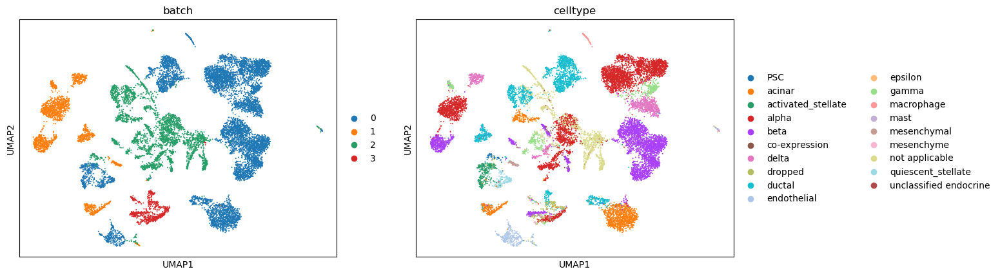

In [81]:
sc.pl.umap(
    adata_all, color=["batch", "celltype"], palette=sc.pl.palettes.vega_20_scanpy
)

In [83]:
%%time
sc.external.pp.bbknn(adata_all, batch_key="batch")

CPU times: user 1.79 s, sys: 23.2 ms, total: 1.81 s
Wall time: 1.65 s


In [85]:
sc.tl.umap(adata_all)

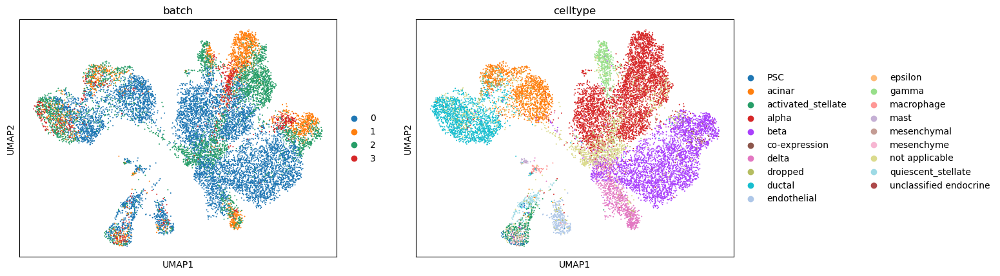

In [87]:
sc.pl.umap(adata_all, color=["batch", "celltype"])

In [89]:
adata_ref = adata_all[adata_all.obs.batch == "0"]

In [91]:
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)

/home/mohammad/anaconda3/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:317: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


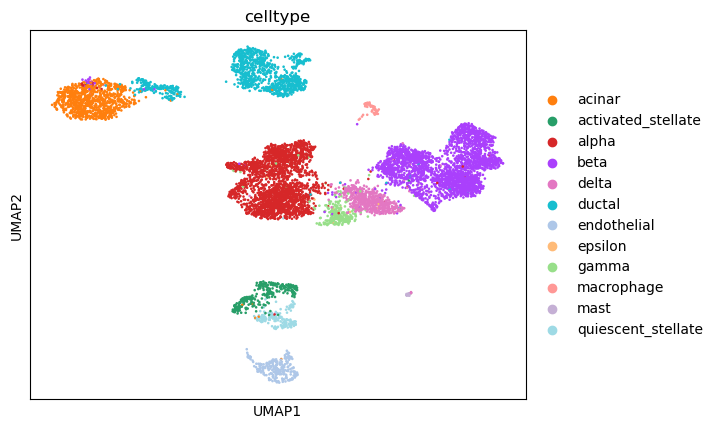

In [93]:
sc.pl.umap(adata_ref, color="celltype")

# Trajectory

In [1]:
import numpy as np
import matplotlib.pyplot as pl
import scanpy as sc

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
results_file = "./write/paul15.h5ad"
# low dpi (dots per inch) yields small inline figures
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(3, 3), facecolor="white")

-----
anndata     0.10.9
scanpy      1.10.3
-----
PIL                         10.3.0
anyio                       NA
arrow                       1.2.3
asttokens                   NA
astunparse                  1.6.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.11.0
bottleneck                  1.3.7
brotli                      1.0.9
certifi                     2024.08.30
cffi                        1.16.0
chardet                     4.0.0
charset_normalizer          2.0.4
cloudpickle                 2.2.1
colorama                    0.4.6
comm                        0.2.1
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.12.2
dask                        2024.5.0
dateutil                    2.9.0.post0
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
dill                        0.3.8
executing                   0.8.3
fastjsonschema      

In [5]:
adata = sc.datasets.paul15()

In [7]:
adata

AnnData object with n_obs × n_vars = 2730 × 3451
    obs: 'paul15_clusters'
    uns: 'iroot'

In [9]:
# this is not required and results will be comparable without it
adata.X = adata.X.astype("float64")

In [11]:
sc.pp.recipe_zheng17(adata)

running recipe zheng17
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
    finished (0:00:00)


In [13]:
sc.tl.pca(adata, svd_solver="arpack")

computing PCA
    with n_comps=50
    finished (0:00:01)


In [33]:
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)
sc.tl.draw_graph(adata)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:13)


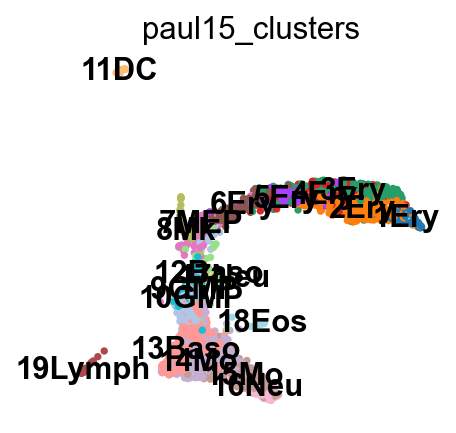

In [35]:
sc.pl.draw_graph(adata, color="paul15_clusters", legend_loc="on data")

In [37]:
import tensorflow

In [39]:
sc.tl.diffmap(adata)
sc.pp.neighbors(adata, n_neighbors=10, use_rep="X_diffmap")

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         1.         0.9989278  0.99671    0.99430376 0.98939794
     0.9883687  0.98731077 0.98398703 0.983007   0.9790806  0.9762548
     0.9744365  0.9729161  0.9652972 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [41]:
sc.tl.draw_graph(adata)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:11)


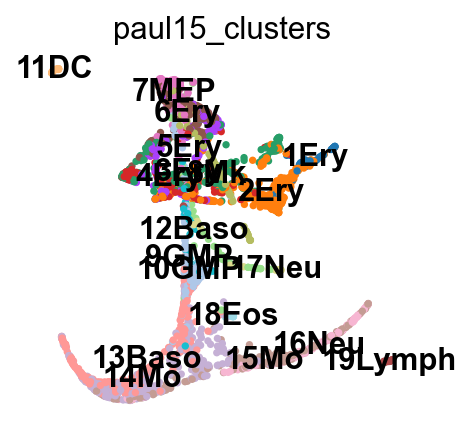

In [43]:
sc.pl.draw_graph(adata, color="paul15_clusters", legend_loc="on data")

In [45]:
sc.tl.louvain(adata, resolution=1.0)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 25 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


In [47]:
sc.tl.paga(adata, groups="louvain")

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


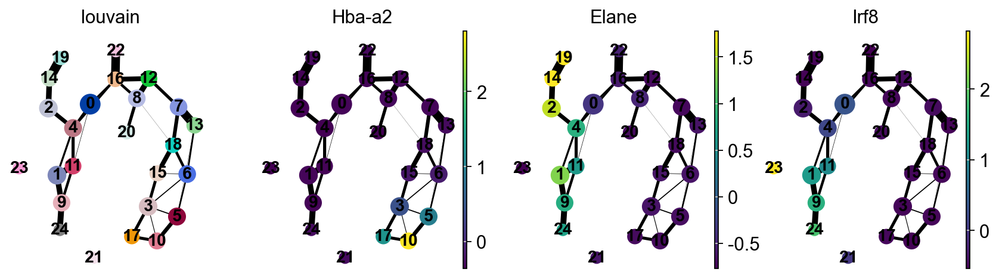

In [49]:
sc.pl.paga(adata, color=["louvain", "Hba-a2", "Elane", "Irf8"])

--> added 'pos', the PAGA positions (adata.uns['paga'])


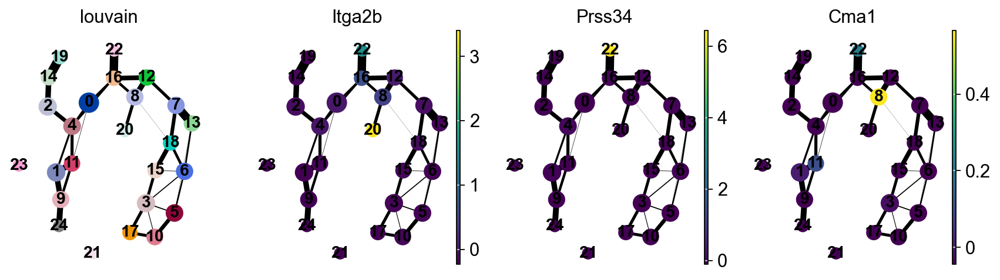

In [51]:
sc.pl.paga(adata, color=["louvain", "Itga2b", "Prss34", "Cma1"])

In [53]:
adata.obs["louvain"].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24'],
      dtype='object')

In [55]:
adata.obs["louvain_anno"] = adata.obs["louvain"]

In [57]:
sc.tl.paga(adata, groups="louvain_anno")

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


<Axes: >

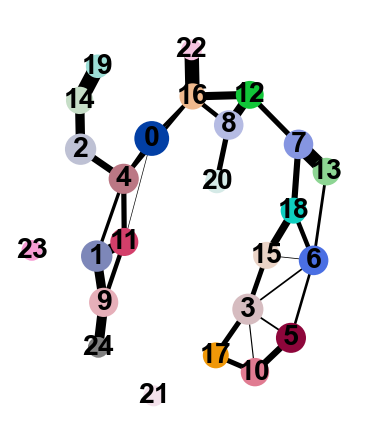

In [59]:
sc.pl.paga(adata, threshold=0.03, show=False)

In [61]:
sc.tl.draw_graph(adata, init_pos="paga")

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:11)


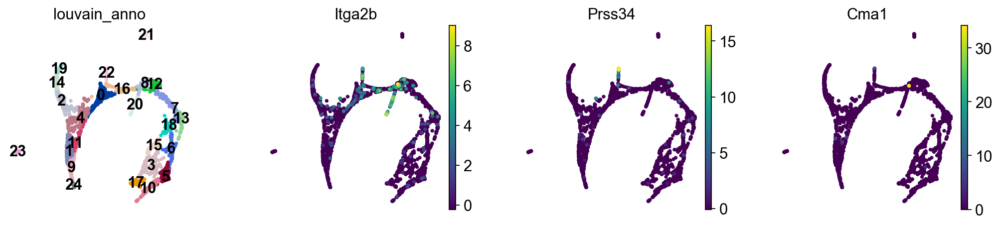

In [65]:
sc.pl.draw_graph(
    adata, color=["louvain_anno", "Itga2b", "Prss34", "Cma1"], legend_loc="on data"
)

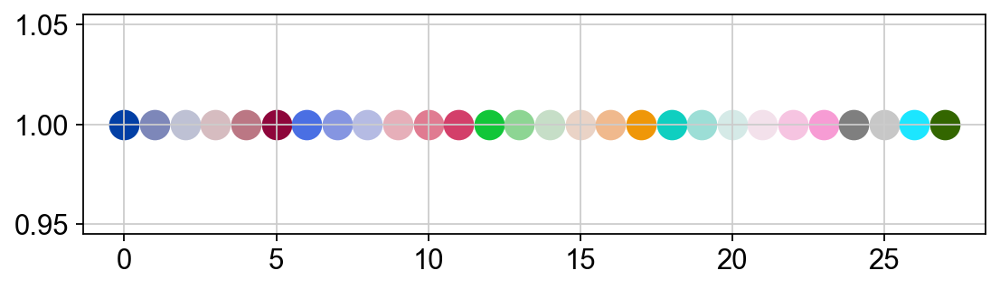

In [67]:
pl.figure(figsize=(8, 2))
for i in range(28):
    pl.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
pl.show()

In [69]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(adata.uns["louvain_anno_colors"])

In [71]:
new_colors[[16]] = zeileis_colors[[12]]  # Stem colors / green
new_colors[[10, 17, 5, 3, 15, 6, 18, 13, 7, 12]] = zeileis_colors[  # Ery colors / red
    [5, 5, 5, 5, 11, 11, 10, 9, 21, 21]
]
new_colors[[20, 8]] = zeileis_colors[[17, 16]]  # Mk early Ery colors / yellow
new_colors[[4, 0]] = zeileis_colors[[2, 8]]  # lymph progenitors / grey
new_colors[[22]] = zeileis_colors[[18]]  # Baso / turquoise
new_colors[[19, 14, 2]] = zeileis_colors[[6, 6, 6]]  # Neu / light blue
new_colors[[24, 9, 1, 11]] = zeileis_colors[[0, 0, 0, 0]]  # Mo / dark blue
new_colors[[21, 23]] = zeileis_colors[[25, 25]]  # outliers / grey

In [73]:
adata.uns["louvain_anno_colors"] = new_colors

--> added 'pos', the PAGA positions (adata.uns['paga'])


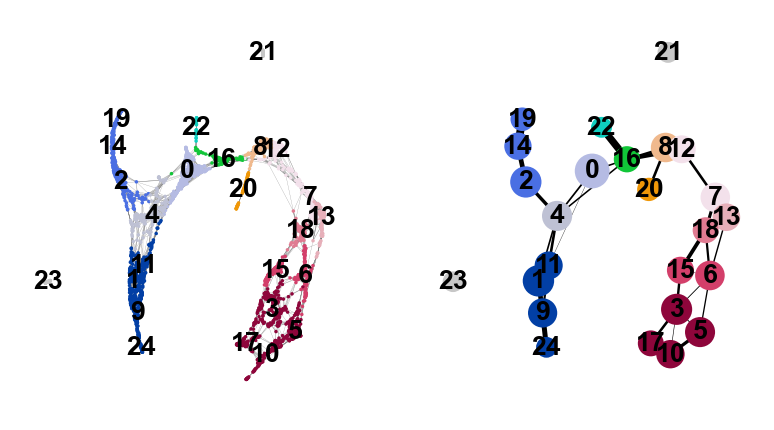

[<Axes: xlabel='FA1', ylabel='FA2'>, <Axes: >]

In [75]:
sc.pl.paga_compare(
    adata,
    threshold=0.03,
    title="",
    right_margin=0.2,
    size=10,
    edge_width_scale=0.5,
    legend_fontsize=12,
    fontsize=12,
    frameon=False,
    edges=True,
    save=True,
)

In [77]:
gene_names = [
    *["Gata2", "Gata1", "Klf1", "Epor", "Hba-a2"],  # erythroid
    *["Elane", "Cebpe", "Gfi1"],  # neutrophil
    *["Irf8", "Csf1r", "Ctsg"],  # monocyte
]

In [79]:
adata_raw = sc.datasets.paul15()
sc.pp.log1p(adata_raw)
sc.pp.scale(adata_raw)
adata.raw = adata_raw

KeyError: 'dpt_pseudotime'

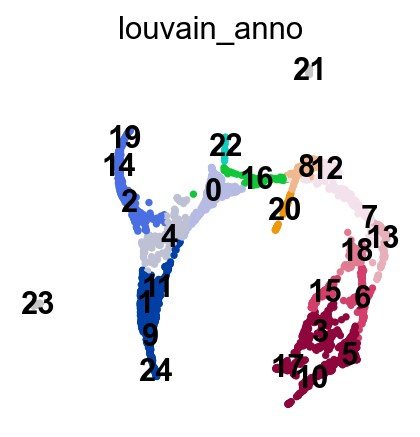

In [81]:
sc.pl.draw_graph(adata, color=["louvain_anno", "dpt_pseudotime"], legend_loc="on data")

In [87]:
adata.obs["dpt_pseudotime"]

KeyError: 'dpt_pseudotime'

# Spatial

In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.10.9
scanpy      1.10.3
-----
PIL                         10.3.0
anyio                       NA
arrow                       1.2.3
asttokens                   NA
astunparse                  1.6.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.11.0
bottleneck                  1.3.7
brotli                      1.0.9
certifi                     2024.08.30
cffi                        1.16.0
chardet                     4.0.0
charset_normalizer          2.0.4
cloudpickle                 2.2.1
colorama                    0.4.6
comm                        0.2.1
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.12.2
dask                        2024.5.0
dateutil                    2.9.0.post0
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
dill                        0.3.8
executing                   0.8.3
fastjsonschema      

In [15]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

HTTPError: HTTP Error 403: Forbidden

In [41]:
adata = sc.datasets.visium_sge(sample_id="V1_Mouse_Brain")

HTTPError: HTTP Error 403: Forbidden

In [45]:
help(sc.datasets.visium_sge)

Help on function visium_sge in module scanpy.datasets._datasets:

visium_sge(sample_id: 'VisiumSampleID' = 'V1_Breast_Cancer_Block_A_Section_1', *, include_hires_tiff: 'bool' = False) -> 'AnnData'
    Processed Visium Spatial Gene Expression data from 10x Genomics’ database.

    The database_ can be browsed online to find the ``sample_id`` you want.

    .. _database: https://support.10xgenomics.com/spatial-gene-expression/datasets

    Parameters
    ----------
    sample_id
        The ID of the data sample in 10x’s spatial database.
    include_hires_tiff
        Download and include the high-resolution tissue image (tiff) in
        `adata.uns["spatial"][sample_id]["metadata"]["source_image_path"]`.

    Returns
    -------
    Annotated data matrix.

    Examples
    --------

    >>> import scanpy as sc
    >>> sc.datasets.visium_sge(sample_id='V1_Breast_Cancer_Block_A_Section_1')
    AnnData object with n_obs × n_vars = 3798 × 36601
        obs: 'in_tissue', 'array_row', 'array